In [1]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt 
import seaborn as sns 
from sklearn.model_selection import train_test_split 

import warnings
warnings.filterwarnings('ignore')

In [2]:
df= pd.read_csv("D:\\Sandesh\\Data Science\\Feature Selection\\train_digit_recognize.csv")
df.head()

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [3]:
df.shape

(42000, 785)

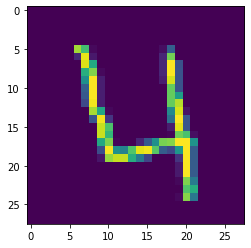

In [4]:
plt.imshow(df.iloc[3,1:].values.reshape(28,28))

In [5]:
X=df.iloc[:,1:]
y=df.iloc[:,0]
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.20,
                                               random_state=1)


In [6]:
y_test.shape

(8400,)

In [7]:
from sklearn.neighbors import KNeighborsClassifier

knn= KNeighborsClassifier()
knn.fit(X_train,y_train)
y_predict=knn.predict(X_test)


In [8]:
from sklearn.metrics import accuracy_score
print(accuracy_score(y_test,y_predict))

0.9671428571428572


### Apply PCA 

### 1- Standarize the values 

In [9]:
from sklearn.preprocessing import StandardScaler
stsc= StandardScaler()
X_train=stsc.fit_transform(X_train)
X_test=stsc.transform(X_test)

In [10]:
from sklearn.decomposition import PCA

# specify the no of columns required if mention None 
# same no of columns will be available.

pca = PCA(n_components=None)
X_train=pca.fit_transform(X_train)
X_test=pca.transform(X_test)

In [11]:
X_train.shape

(33600, 784)

In [12]:

# Now specify 100 columns to be created
pca = PCA(n_components=200)
X_train_trf=pca.fit_transform(X_train)
X_test_trf=pca.transform(X_test)
X_train_trf.shape

(33600, 200)

In [13]:
i=2
knn=KNeighborsClassifier()
knn.fit(X_train_trf,y_train)
y_predict=knn.predict(X_test_trf)
print(i,accuracy_score(y_test,y_predict))


2 0.950952380952381


In [16]:
for i in range(1,785):
    pca = PCA(n_components=i)
    X_train_trf=pca.fit_transform(X_train)
    X_test_trf=pca.transform(X_test)
    
    knn=KNeighborsClassifier()
    knn.fit(X_train_trf,y_train)
    y_predict=knn.predict(X_test_trf)
    print("{}-{}".format(i,accuracy_score(y_test,y_predict)))

# We can check the accuracy for all the values ranging from 1-785,
# and stop when we get the high accuracy.
# after certain point accuracy will decrease.
    

1-0.2561904761904762
2-0.3277380952380952
3-0.5146428571428572
4-0.6604761904761904
5-0.7364285714285714
6-0.8252380952380952
7-0.8448809523809524
8-0.8758333333333334
9-0.8879761904761905
10-0.9071428571428571
11-0.9157142857142857
12-0.9222619047619047


KeyboardInterrupt: 

### Visualize the components into 2D

In [17]:
pca = PCA(n_components=2)
X_train_trf=pca.fit_transform(X_train)
X_test_trf=pca.transform(X_test)
X_train_trf.shape

(33600, 2)

In [26]:
X_test_trf.shape

(8400, 2)

In [27]:
X_train_trf.shape

(33600, 2)

In [28]:
import plotly.express as px

y_train_trf=y_train.astype(str)

fig=px.scatter(x=X_train_trf[:,0],
               y=X_train_trf[:,1],
               color=y_train_trf,
               color_discrete_sequence=px.colors.qualitative.G10
               )

fig.show()


In [29]:
pca = PCA(n_components=3)
X_train_trf=pca.fit_transform(X_train)
X_test_trf=pca.transform(X_test)

In [33]:
y_train_trf=y_train.astype(str)

fig=figsize=(50,10)
fig=px.scatter_3d(df,x=X_train_trf[:,0],
               y=X_train_trf[:,1],
               z=X_train_trf[:,2],   
               color=y_train_trf)

fig.update_layout(
            margin=dict(l=30,r=20,t=20,b=20)
)

fig.show()

In [34]:

# Eigen values
pca.explained_variance_

array([40.75597528, 29.08811404, 26.66609113])

In [36]:
pca.explained_variance_ratio_

array([0.05772629, 0.04120007, 0.03776954])

In [35]:

# Eigen vectors
pca.components_

array([[ 1.00000000e+00, -9.30607862e-11, -1.73385150e-10, ...,
         8.36445371e-34, -2.21382191e-33, -2.39607450e-33],
       [ 8.52435507e-11,  1.00000000e+00,  2.94554100e-08, ...,
        -1.68141667e-33,  1.69787463e-35,  2.59845033e-33],
       [ 1.51980542e-10, -2.85137865e-08,  9.99999997e-01, ...,
         5.20824353e-34,  2.23999257e-34,  1.15923960e-33]])

### Find optimal no of Principal Components

In [37]:
pca = PCA(n_components=None)
X_train_trf=pca.fit_transform(X_train)
X_test_trf=pca.transform(X_test)

In [40]:
pca.explained_variance_ratio_.shape

(784,)

In [42]:

# It is showing individual components explaining how many variance it 
# has covered
# But he have select n no of components which has covered 90% variance.
# hence apply cumsum.

pca.explained_variance_ratio_

array([5.77262922e-02, 4.12000685e-02, 3.77695438e-02, 2.96207504e-02,
       2.55760656e-02, 2.24296023e-02, 1.95828184e-02, 1.76863615e-02,
       1.57282515e-02, 1.42738884e-02, 1.36707201e-02, 1.22320264e-02,
       1.14728085e-02, 1.11805154e-02, 1.05191342e-02, 1.01835039e-02,
       9.53843591e-03, 9.37370873e-03, 9.07503214e-03, 8.89845836e-03,
       8.40783418e-03, 8.14627115e-03, 7.78134548e-03, 7.56719359e-03,
       7.29590530e-03, 7.00257145e-03, 6.91538691e-03, 6.68190243e-03,
       6.33520940e-03, 6.15956763e-03, 6.07288305e-03, 6.00491068e-03,
       5.76573760e-03, 5.73815033e-03, 5.64835407e-03, 5.49763479e-03,
       5.41604229e-03, 5.26292624e-03, 5.04508394e-03, 4.90831561e-03,
       4.87321197e-03, 4.76499472e-03, 4.63662683e-03, 4.59117250e-03,
       4.53999214e-03, 4.48192247e-03, 4.43203299e-03, 4.37548083e-03,
       4.32156207e-03, 4.30178075e-03, 4.22689926e-03, 4.14683096e-03,
       4.08731306e-03, 4.00393603e-03, 3.97233536e-03, 3.91617947e-03,
      

In [39]:
np.cumsum(pca.explained_variance_ratio_)

array([0.05772629, 0.09892636, 0.1366959 , 0.16631665, 0.19189272,
       0.21432232, 0.23390514, 0.2515915 , 0.26731975, 0.28159364,
       0.29526436, 0.30749639, 0.3189692 , 0.33014971, 0.34066885,
       0.35085235, 0.36039079, 0.3697645 , 0.37883953, 0.38773799,
       0.39614582, 0.40429209, 0.41207344, 0.41964063, 0.42693654,
       0.43393911, 0.44085449, 0.4475364 , 0.45387161, 0.46003117,
       0.46610406, 0.47210897, 0.47787471, 0.48361286, 0.48926121,
       0.49475884, 0.50017489, 0.50543781, 0.5104829 , 0.51539121,
       0.52026442, 0.52502942, 0.52966605, 0.53425722, 0.53879721,
       0.54327913, 0.54771117, 0.55208665, 0.55640821, 0.56070999,
       0.56493689, 0.56908372, 0.57317103, 0.57717497, 0.5811473 ,
       0.58506348, 0.58892089, 0.59274036, 0.59642296, 0.60008844,
       0.60368522, 0.6072144 , 0.61069911, 0.61414882, 0.61757117,
       0.62098573, 0.62436077, 0.62767585, 0.63094538, 0.63415873,
       0.63735435, 0.64053188, 0.64366798, 0.64676739, 0.64981

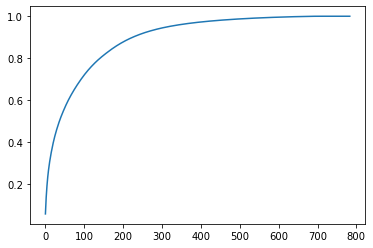

In [41]:

# 90% variance is explained by 220-230 components.
# Hence 220-230 components can be given as hyperparameters.

plt.plot(np.cumsum(pca.explained_variance_ratio_))